### Correlation between metals with and without spatial context.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
location_data = pd.read_csv("/content/drive/MyDrive/MMPL_GEOCHEM GSI FROM BHUKOSH/CSV FILE/GEOCHEM_STREAM_REGOLITH_SOIL_SAMPLES.csv")

In [ ]:
location_data

,S. No.,Sample type,Sample No.,Longitude,Latitude,Pb (2 ppm) (in ppm),Ni (2 ppm) (in ppm),Cu (1 ppm) (in ppm),Zn (10 ppm) (in ppm),Au ppb,Source
0,1,STREAM SEDIMENT,45K8/026/S/06,74.495000,25.026900,26.0,28.0,17.0,51.0,4.0,BHUKOSH GSI
1,2,STREAM SEDIMENT,45K8/025/S/06,74.480000,25.026900,24.0,39.0,21.0,51.0,1.5,BHUKOSH GSI
2,3,STREAM SEDIMENT,45K8/024/S/06,74.460000,25.026900,22.0,29.0,16.0,47.0,1.5,BHUKOSH GSI
3,4,STREAM SEDIMENT,45K8/039/S/06,74.495000,25.045000,28.0,32.0,22.0,52.0,5.0,BHUKOSH GSI
4,5,STREAM SEDIMENT,45K8/038/S/06,74.480000,25.045000,24.0,34.0,23.0,66.0,1.5,BHUKOSH GSI
...,...,...,...,...,...,...,...,...,...,...,...
3718,3719,SOIL C HORIZON,46E13/7/C/16,73.812556,23.966444,17.0,34.0,39.0,23.0,0.0,BHUKOSH GSI
3719,3720,SOIL C HORIZON,46I01/007/C/12,74.070000,23.980000,18.0,27.0,2.0,26.0,1.5,BHUKOSH GSI
3720,3721,SOIL C HORIZON,45H16/001/C/S/14,73.810000,24.000000,20.0,15.0,3.0,46.0,0.5,BHUKOSH GSI
3721,3722,SOIL C HORIZON,45H16/002/C/S/14,73.870000,24.010000,23.0,19.0,8.0,40.0,1.0,BHUKOSH GSI


In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(location_data, lat="Latitude", lon="Longitude", color="Pb (2 ppm) (in ppm)", size="Ni (2 ppm) (in ppm)",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10,
                  mapbox_style="carto-positron")
fig.show()


In [ ]:
import plotly.express as px

fig = px.scatter_mapbox(
    location_data,
    lat="Latitude",
    lon="Longitude",
    zoom=10,
    mapbox_style="carto-positron"
)

fig.show()

In [ ]:
import folium

m = folium.Map(location=[location_data['Latitude'].mean(), location_data['Longitude'].mean()], zoom_start=12)

for idx, row in location_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Pb: {row['Pb (2 ppm) (in ppm)']} ppm, Ni: {row['Ni (2 ppm) (in ppm)']} ppm, Cu: {row['Cu (1 ppm) (in ppm)']} ppm, Zn: {row['Zn (10 ppm) (in ppm)']} ppm, Au: {row['Au ppb']} ppb",
        icon=folium.Icon(color='blue')
    ).add_to(m)

m

In [ ]:
import matplotlib
def create_map(df, metal_column, metal_name):
    m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)
    min_value = df[metal_column].min()
    max_value = df[metal_column].max()

    for idx, row in df.iterrows():
        color = plt.cm.viridis((row[metal_column] - min_value) / (max_value - min_value))
        color = matplotlib.colors.to_hex(color)
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=8,
            popup=f"{metal_name}: {row[metal_column]}",
            color=color,
            fill=True,
            fill_color=color
        ).add_to(m)
    return m


maps = {}
metals = ['Pb (2 ppm) (in ppm)', 'Ni (2 ppm) (in ppm)', 'Cu (1 ppm) (in ppm)', 'Zn (10 ppm) (in ppm)', 'Au ppb']
for metal in metals:
    metal_name = metal.split(' ')[0]
    maps[metal_name] = create_map(location_data, metal, metal_name)

maps['Pb']

In [ ]:
maps

{'Pb': <folium.folium.Map at 0x79f5c7fd9810>,
 'Ni': <folium.folium.Map at 0x79f59bae1180>,
 'Cu': <folium.folium.Map at 0x79f59140bb50>,
 'Zn': <folium.folium.Map at 0x79f5905ba830>,
 'Au': <folium.folium.Map at 0x79f58f5696f0>}

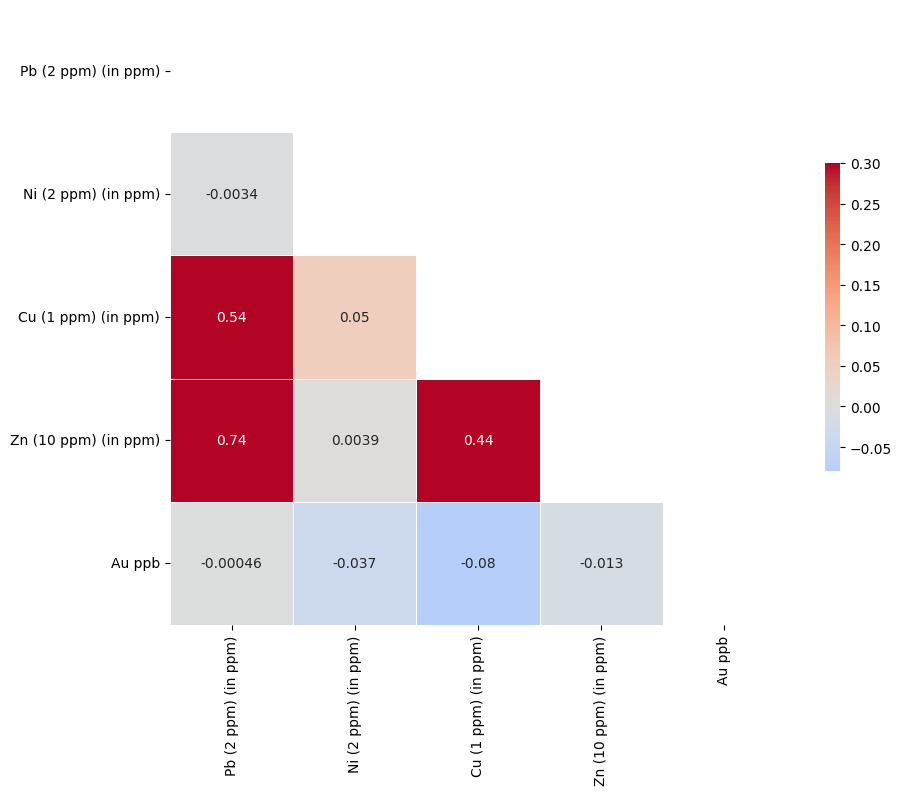

In [ ]:
import seaborn as sns

df = location_data[metals]
corr = df.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10, 8))

sns.heatmap(corr, mask=mask, cmap='coolwarm', vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show()

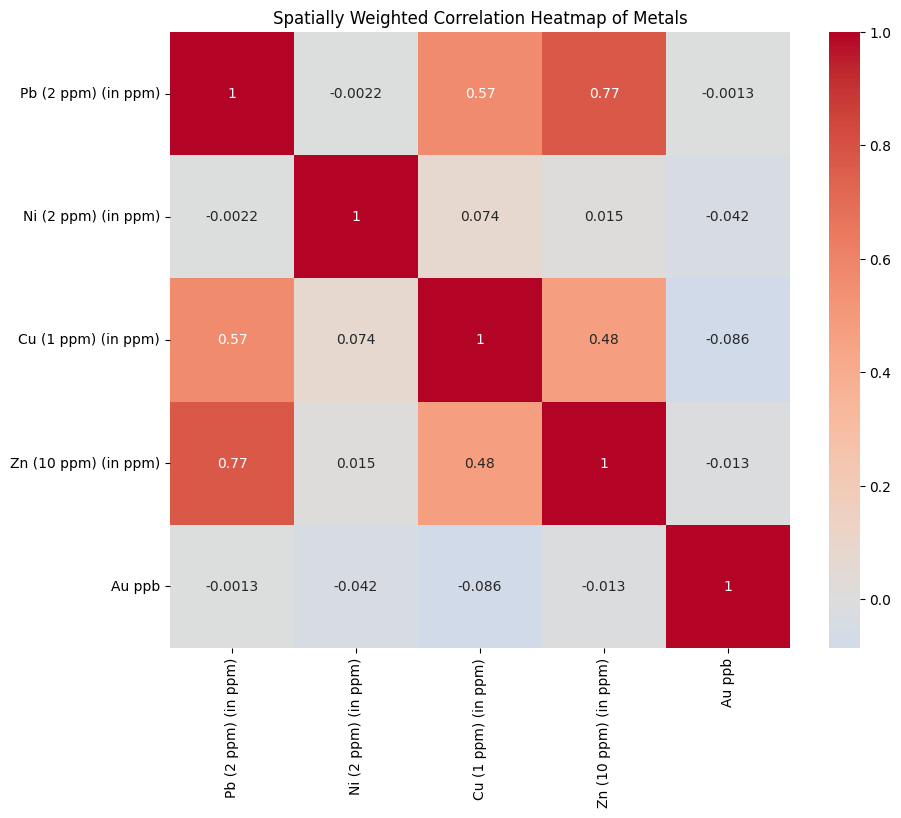

In [ ]:
from scipy.spatial import distance_matrix

def spatial_corr_matrix(df, metals, decay):
    coords = df[['Latitude', 'Longitude']]
    dists = distance_matrix(coords, coords)
    weights = np.exp(-decay * dists)  #decay : corresponds to the decrease in weights based on distance.

    corr_matrix = pd.DataFrame(index=metals, columns=metals)

    for i in metals:
        for j in metals:
            if i != j:
                weighted_mean_i = np.average(df[i], weights=weights.sum(axis=0))
                weighted_mean_j = np.average(df[j], weights=weights.sum(axis=0))
                weighted_cov = np.average((df[i]-weighted_mean_i)*(df[j]-weighted_mean_j), weights=weights.sum(axis=0))
                weighted_var_i = np.average((df[i]-weighted_mean_i)**2, weights=weights.sum(axis=0))
                weighted_var_j = np.average((df[j]-weighted_mean_j)**2, weights=weights.sum(axis=0))

                corr = weighted_cov / np.sqrt(weighted_var_i * weighted_var_j)
                corr_matrix.at[i, j] = corr
            else:
                corr_matrix.at[i, j] = 1
    return corr_matrix.astype(float)


corr_matrix = spatial_corr_matrix(location_data, metals, decay=5.0)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Spatially Weighted Correlation Heatmap of Metals')
plt.show()

## Algorithms used:
1. Z_score = computes the X-mu/sigma to normalise the data points and checks for outlier values
2. IQR = InterQuartie Range between 1st and 3rd quartiles using Medians
3. Isolation Forest = ML algorithm which uses Decision Trees to classify each data point. If a data point can be easily 'isolated' i.e; classified than other data points, it is considered an anomaly.
Finally, I do a majority vote to only return those points with votes from atleast 2 of the algorithms for robustness

In [ ]:
from sklearn.ensemble import IsolationForest
from scipy import stats

z = np.abs(stats.zscore(location_data[metals]))
z_score_outliers = (z > 3).any(axis=1)

Q1 = location_data[metals].quantile(0.25)
Q3 = location_data[metals].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = ((location_data[metals] < (Q1 - 1.5 * IQR)) | (location_data[metals] > (Q3 + 1.5 * IQR))).any(axis=1)

iso_forest = IsolationForest(contamination='auto')
predictions = iso_forest.fit_predict(location_data[metals])
iso_forest_outliers = pd.Series(predictions == -1)

outlier_votes = pd.DataFrame({
    'Z-Score': z_score_outliers,
    'IQR': iqr_outliers,
    'Isolation Forest': iso_forest_outliers
})

outlier_votes['votes'] = outlier_votes.sum(axis=1)
confirmed_outliers = outlier_votes[outlier_votes['votes'] >= 2]

print("Rows flagged as outliers by majority voting:")
print(confirmed_outliers)

Rows flagged as outliers by majority voting:
      Z-Score   IQR  Isolation Forest  votes
13       True  True              True      3
39      False  True              True      2
59      False  True              True      2
164      True  True              True      3
165      True  True              True      3
...       ...   ...               ...    ...
3697     True  True              True      3
3706     True  True              True      3
3708     True  True              True      3
3709     True  True              True      3
3710     True  True              True      3

[297 rows x 4 columns]


In [ ]:
location_data.shape

(3723, 11)

In [ ]:
outlier_votes

,Z-Score,IQR,Isolation Forest,votes
0,False,True,False,1
1,False,False,False,0
2,False,False,False,0
3,False,True,False,1
4,False,False,False,0
...,...,...,...,...
3718,False,False,False,0
3719,False,False,False,0
3720,False,False,False,0
3721,False,False,False,0


In [ ]:
outlier_indices = outlier_votes[outlier_votes['votes'] >= 2].index

outlier_df = location_data.loc[outlier_indices]

print("Outlier Data:")
print(outlier_df)

location_data['outlier_flag'] = 0

location_data.loc[outlier_indices, 'outlier_flag'] = 1

location_data.to_csv("/content/drive/MyDrive/GEOCHEM_outliers.csv", index=False)

Outlier Data:
      S. No.      Sample type       Sample No.  Longitude   Latitude  \
13        14  STREAM SEDIMENT    45L6/130/S/17  74.496831  24.671519   
39        40  STREAM SEDIMENT    45K8/181/S/06  74.480000  25.243600   
59        60  STREAM SEDIMENT    45K8/167/S/06  74.460000  25.225500   
164      165  STREAM SEDIMENT   45L07/026/S/17  74.500000  24.277167   
165      166  STREAM SEDIMENT   45L07/025/S/17  74.476806  24.277167   
...      ...              ...              ...        ...        ...   
3697    3698   SOIL C HORIZON  46E14/A1/C/2016  73.812500  23.542800   
3706    3707   SOIL C HORIZON     46E13/3/C/16  73.930417  23.801333   
3708    3709   SOIL C HORIZON     46E13/2/C/16  73.884444  23.810000   
3709    3710   SOIL C HORIZON     46E13/1/C/16  73.773333  23.825444   
3710    3711   SOIL C HORIZON     46E13/5/C/16  73.874972  23.841194   

      Pb (2 ppm) (in ppm)  Ni (2 ppm) (in ppm)  Cu (1 ppm) (in ppm)  \
13                   34.0                 66.0    

In [ ]:
location_data['Sample type'].value_counts()

,count
Sample type,
STREAM SEDIMENT,3436
SOIL C HORIZON,145
SOIL REGOLITH,142


In [ ]:
outlier_df['Sample type'].value_counts()

,count
Sample type,
STREAM SEDIMENT,273
SOIL REGOLITH,13
SOIL C HORIZON,11
